<a href="https://colab.research.google.com/github/Lamivan101/CycleGAN-for-Generated-Aged-Image-Classification/blob/main/CycleGAN_for_Generated_Aged_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# 1. Libary Imports and Data Loading



## 1.1 Library Imports

### Software and Hardware Environments

In [ ]:
# import random
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

!pip show tensorflow
print("\n")
!nvcc --version
print("\n")
!python --version
print("\n")
!nvidia-smi
# ! pip show protobuf


### Install a extra tensorflow addon


In [ ]:
!pip install tensorflow-addons

### Google Drive Mount and Load necessary libraies

In [ ]:
# from google.colab import drive
import os
# drive.mount('/content/drive')
# data_path = "/content/drive/My Drive/Project/Datasets"
data_path = "Dataset"

# vgg_path = os.path.join(data_path, 'vgg19.npz')

celeb_path = os.path.join(data_path, 'Celebrities')
wiki_path = os.path.join(data_path, 'wiki')
wiki_old_young_path = os.path.join(data_path, 'wiki_old_young')

In [ ]:
# Basic Libraries
import numpy as np
import pandas as pd
import tensorflow as tf
import shutil
import random
import math
import itertools
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix

# Important submodules and functions from Tensorflow (and Keras)
from tensorflow.keras.layers import Input, Dense, Conv2D, UpSampling2D, Reshape, MaxPooling2D, Lambda, Layer, GlobalAveragePooling2D, BatchNormalization, Activation, LeakyReLU, Flatten, concatenate, Dropout,ReLU,Conv2DTranspose,Concatenate, ZeroPadding2D
from tensorflow.keras.models import Sequential, Model, load_model
from keras.preprocessing.image import array_to_img
from tensorflow_addons.layers import InstanceNormalization
# from tensorflow_examples.models.pix2pix import pix2pix

# Image handling and visualization
from matplotlib import pyplot as plt
from matplotlib import image as mpimg
from IPython.display import display
from tqdm.notebook import tqdm
import cv2

# Other utility
import datetime
import psutil

# Module settings:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # This will hide all TensorFlow messages, except for errors.
tf.get_logger().setLevel('ERROR')  # This sets TensorFlow logger to only output error messages.

## 1.2 Data Loaders

### Utility Functions

In [ ]:
# Loads an image from disk, optionally resizes it, and prepares it for the model.
def get_image(img_path, resize=True, shape=(256,256), normalize = False):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR (OpenCV default) to RGB
    if resize:
        image = cv2.resize(image, shape)  # Resize image
        image = image.astype(np.float32)

    if normalize:
        image = normalize_image(image)

     # Convert to float32 for model compatibility

    return image

# Finds and returns a list of images (files) within a directory path that matches a certain file type.
def find_images(dir_path, file_type):
    image_paths = []

    for root, _, files in os.walk(dir_path):
        # print(files)
        for file in files:
            # print(file)
            if f'.{file_type}' in file:
                image_paths.append(os.path.join(root, file))


    return image_paths

def normalize_image(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image



### Data Loaders

In [ ]:
class ImageDataset:
    def __init__(self, dir_path, batch_size=8, file_type="jpg", random_state = 4211):
        # [Your code here]
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.file_type = file_type
        self.random_state = random_state
        self.ds_pointer = 0

        self.images = find_images(dir_path=dir_path, file_type=file_type)


    def reset_pointer(self, seed=None):
        # [Your code here]
        self.ds_pointer = 0
        random.shuffle(self.images)


    def get_batch(self,normalize = False):
        # [Your code here]
        batch = []

        for i in range(self.batch_size):
            img = get_image(img_path = self.images[self.ds_pointer],normalize=normalize)
            batch.append(img)
            self.ds_pointer += 1

            if self.ds_pointer == (len(self.images) - 1):
                self.reset_pointer()
                break
        # print(batch)
        # batch = np.array(batch, dtype ='object')
        return np.array(batch)

    def __len__(self):
        # [Your code here]
        return len(self.images)

In [ ]:
class ClassificationDataset:
    def __init__(self, tsv_path, dir_path, batch_size=16, random_state = 4211):
        self.data = self._process_tsv(tsv_path, dir_path)
        self.batch_size = batch_size
        self.ds_pointer = 0
        self.encoder = OneHotEncoder(sparse_output=False)

        onehotencoded = self.encoder.fit_transform(self.data[['classification_label']])
        self.labelnames = self.encoder.get_feature_names_out()

        for i,label in zip(range(len(self.labelnames)),self.labelnames):
          self.labelnames[i] = label.replace("classification_label_",'')

    def _process_tsv(self, tsv_path, dir_path):
        df = pd.read_csv(tsv_path, sep='\t', header=None, names=['file_name', 'classification_label', 'Status'])
        df['file_path'] = dir_path + '/'  + df['classification_label'] + '/' +  df['file_name']
        return df

    def add_data(self, tsv_path, dir_path):
        new_data = self._process_tsv(tsv_path, dir_path)
        self.data = pd.concat([self.data, new_data], ignore_index=True)
        self.reset_pointer()


    def reset_pointer(self, seed=None):
        self.ds_pointer = 0
        self.data = self.data.sample(frac=1, random_state=seed).reset_index(drop=True)

    def get_batch(self,resize=True, normalize=True):
        if self.ds_pointer + self.batch_size > len(self.data):
            self.reset_pointer()

        onehotencoded = self.encoder.fit_transform(self.data[['classification_label']])
        onehotencoded_batch = onehotencoded[self.ds_pointer:self.ds_pointer + self.batch_size]

        batch_data = self.data.iloc[self.ds_pointer:self.ds_pointer + self.batch_size]

        self.ds_pointer += self.batch_size

        images = [get_image(row['file_path'], resize= resize, normalize=normalize) for _, row in batch_data.iterrows()]
        labels = onehotencoded_batch
        return np.array(images,dtype=object),labels


    def __len__(self):
        # [Your code here]
        return len(self.data)


# 1.3 Data Display

In [ ]:
def batch_display(batch, batch_size, batch_labels = None, datasetlabels = None, greyscale = False, title = None):


  num_cells = math.ceil(math.sqrt(batch_size))

  plt.figure(figsize=(10,10))
  plt.title(title, loc='center',fontdict={'fontsize': 20})
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)

  for i in range(batch_size):
      plt.subplot(num_cells,num_cells,i+1)
      plt.xticks([])
      plt.yticks([])
      plt.grid(False)

      if(greyscale == True):
        img = batch[i]
        plt.imshow(img,cmap='gray')
      else:
        # print(batch[i].shape)
        img = array_to_img(batch[i])
        plt.imshow(img)

      if(batch_labels is not None):
          label = batch_labels[i]
          index = np.where(label == 1)
      if(datasetlabels is not None):
          plt.xlabel(datasetlabels[index])

  plt.show()

In [ ]:
old_ds = ImageDataset(os.path.join(wiki_old_young_path, 'Old'),batch_size=16)
young_ds = ImageDataset(os.path.join(wiki_old_young_path, 'Young'),batch_size=16)


In [ ]:
print("Old Dataset size: ", old_ds.__len__())
print("Young Dataset size: ", young_ds.__len__())

Old Dataset size:  3000
Young Dataset size:  3000


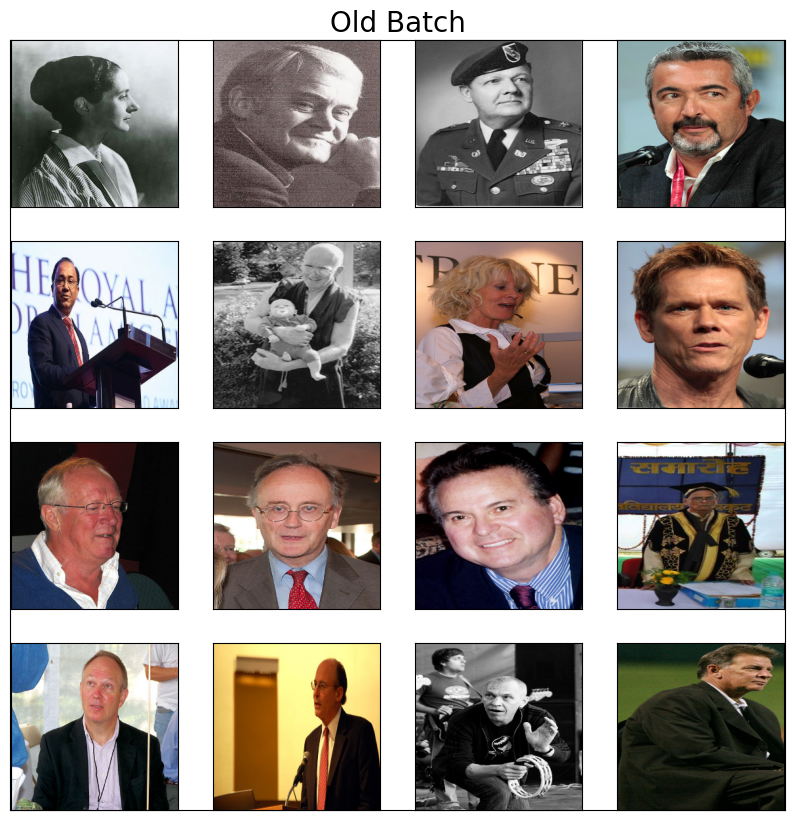

In [ ]:
old_ds.reset_pointer()
young_ds.reset_pointer()

old_display_batch = old_ds.get_batch()
young_display_batch = young_ds.get_batch()

batch_display(old_display_batch, old_ds.batch_size,title='Old Batch')

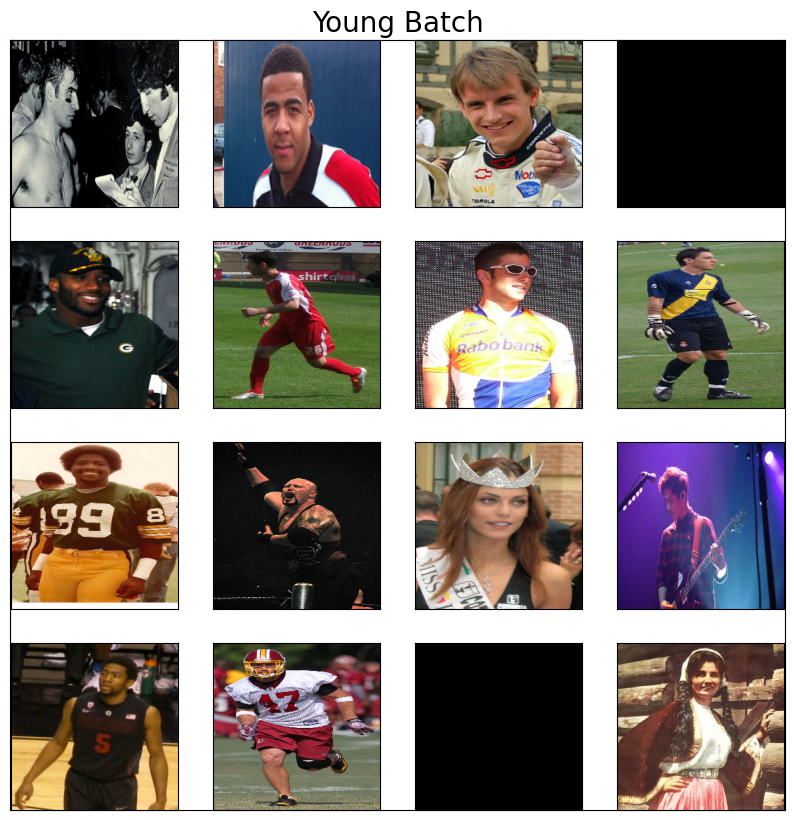

In [ ]:
batch_display(young_display_batch,young_ds.batch_size, title='Young Batch')

# 2. Data Preprocessing

## 2.1 General Preprocessing

In [ ]:
# preprocessing methods

def blur(batch, batch_size): # blurring images of the batch to reduce noise
    temp = []
    for i in range(batch_size):
        blur_img = cv2.GaussianBlur(batch[i],(7,7),8)
        temp.append(blur_img)
    return temp

def random_flip(batch, batch_size, mode): # for mode input: 0 for vertical flip, 1 for horizontal flip
    temp = []
    for i in range(batch_size):
        if random.random() > 0.5:
            flip_img = cv2.flip(batch[i],mode)
            temp.append(flip_img)
        else:
            temp.append(batch[i])

    return temp

def greyscale(batch, batch_size): # turns the images of the batch to greyscale
    temp = []
    for i in range(batch_size):
        grey_img = cv2.cvtColor(batch[i], cv2.COLOR_BGR2GRAY)
        temp.append(grey_img)
    return temp

def threshold(batch, batch_size): # turns the images of the batch to binary (black & white) according to a threshold
    temp = []
    for i in range(batch_size):
        img = cv2.cvtColor(batch[i], cv2.COLOR_BGR2GRAY)
        ret, thresh_img = cv2.threshold(img, 64, 255, cv2.THRESH_BINARY)
        temp.append(thresh_img)
    return temp

In [ ]:
# print(old_display_batch[0])
print(old_display_batch.shape)

(16, 256, 256, 3)


### Display

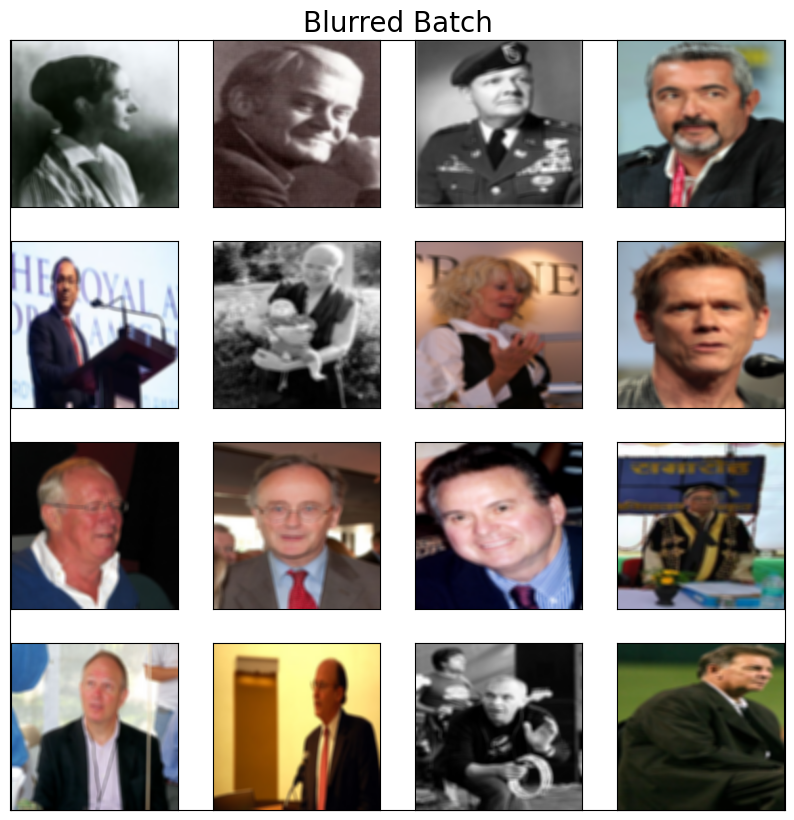

In [ ]:
blurred_batch = blur(old_display_batch, 16)
batch_display(blurred_batch, old_ds.batch_size, title='Blurred Batch')

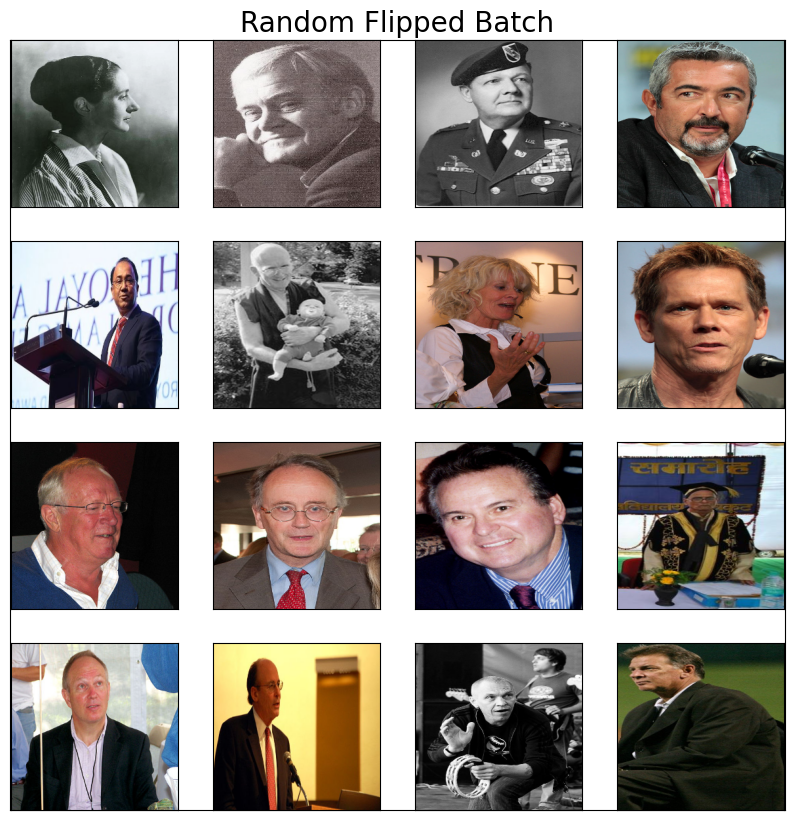

In [ ]:
vertical_flipped_batch = random_flip(old_display_batch, 16, 1)

batch_display(vertical_flipped_batch, old_ds.batch_size, title='Random Flipped Batch')

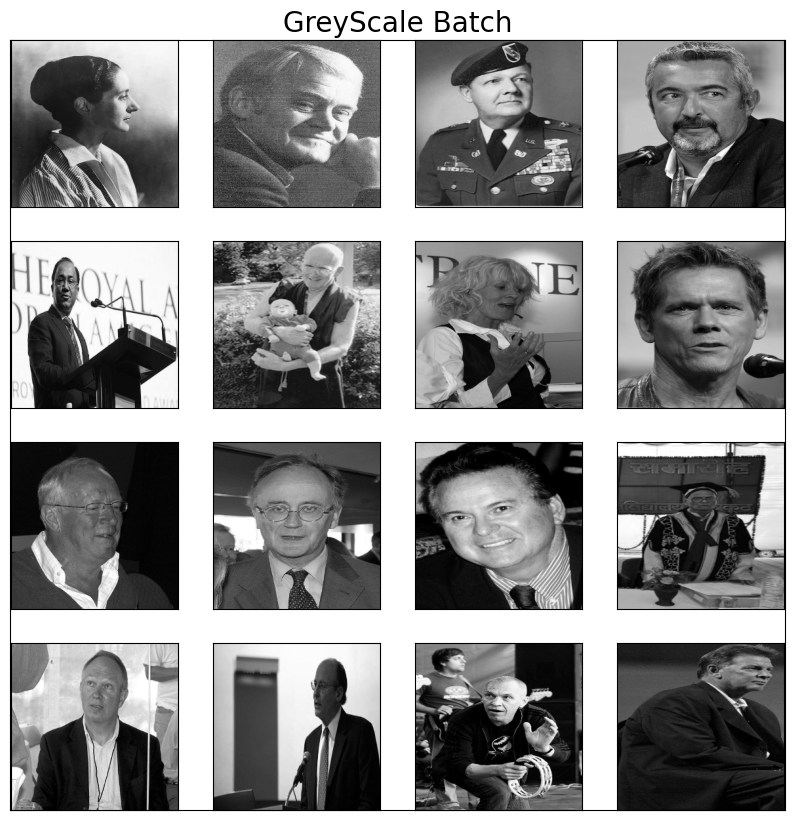

In [ ]:
grey_batch = greyscale(old_display_batch, 16)
batch_display(grey_batch, old_ds.batch_size,greyscale=True, title='GreyScale Batch')


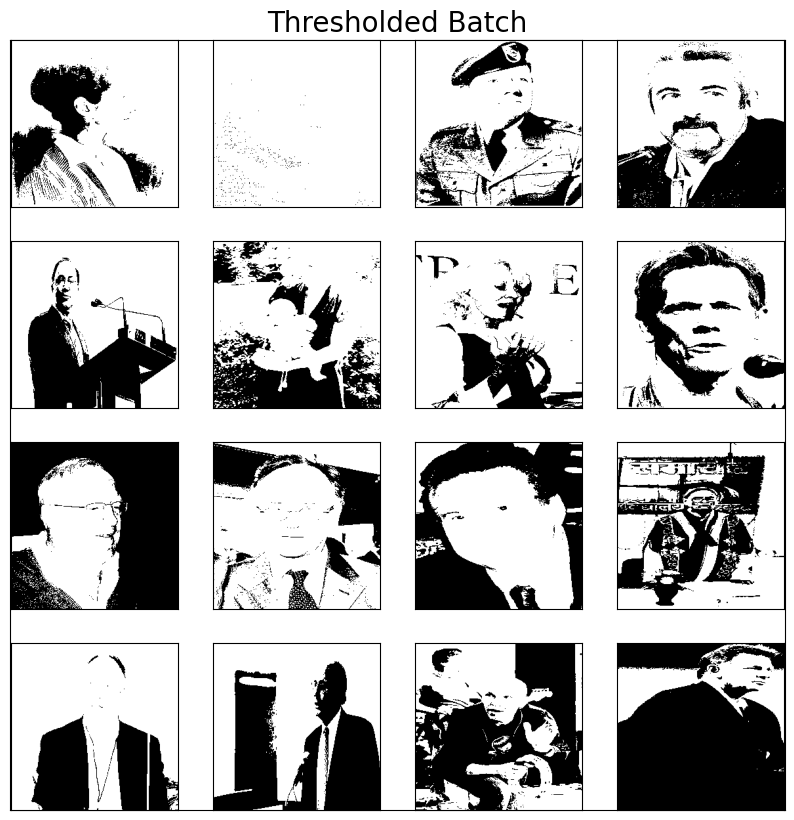

In [ ]:
thresh_batch = threshold(old_display_batch, 16)
batch_display(thresh_batch, old_ds.batch_size,greyscale=True, title='Thresholded Batch')


## 2.2 Face Cropping
Model referenced from OpenCV GitHub
https://github.com/sr6033/face-detection-with-OpenCV-and-DNN/blob/master/res10_300x300_ssd_iter_140000.caffemodel

In [ ]:
def crop_face(batch,batch_size):

    face_batch = []
    net = cv2.dnn.readNetFromCaffe('Face Cropping Modules/deploy.prototxt.txt', 'Face Cropping Modules/res10_300x300_ssd_iter_140000.caffemodel')

    for img in batch:

        # Read the image

        # img = img.numpy()

        (h, w) = img.shape[:2]

        # Preprocess the image for DNN
        blob = cv2.dnn.blobFromImage(cv2.resize(img, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))



        # Forward pass through the network
        net.setInput(blob)
        detections = net.forward()
        # Crop and Save detected faces
        for i in range(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            if confidence > 0.1:
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")
                face = img[startY:endY, startX:endX]

                face_batch.append(face)
                break



    return face_batch


# 3 Aged image generation using Cycle GAN
Referenced from Keras examples
https://keras.io/examples/generative/cyclegan/


### Initialization

In [ ]:
from keras import initializers
from keras.layers import add

In [ ]:
kernel_init = initializers.RandomNormal(mean=0.0, stddev=0.02)
gamma_init = initializers.RandomNormal(mean=0.0, stddev=0.02)
input_img_size = (256, 256, 3)

In [ ]:
class ReflectionPadding2D(Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")

## 3.1 Build Components

### Residual Blocks

In [ ]:
def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = add([input_tensor, x])
    return x

### Upsampling & Downsampling

In [ ]:
def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


## 3.2 Generator and Discriminator

### Generator

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = Conv2D(3, (7, 7), padding="valid")(x)
    x = Activation("tanh")(x)

    model = Model(img_input, x, name=name)
    return model

### Discriminator

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = Input(shape=input_img_size, name=name + "_img_input")
    x = Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = Model(inputs=img_input, outputs=x, name=name)
    return model


In [ ]:
# Get the generators
generator_old = get_resnet_generator(name="generator_G")
generator_young = get_resnet_generator(name="generator_F")

# Get the discriminators
discriminator_x = get_discriminator(name="discriminator_X")
discriminator_y = get_discriminator(name="discriminator_Y")

In [ ]:
generator_old.summary()

Model: "generator_G"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 generator_G_img_input (Inp  [(None, 256, 256, 3)]        0         []                            
 utLayer)                                                                                         
                                                                                                  
 reflection_padding2d (Refl  (None, 262, 262, 3)          0         ['generator_G_img_input[0][0]'
 ectionPadding2D)                                                   ]                             
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         9408      ['reflection_padding2d[0][0]']
                                                                                        

In [ ]:
discriminator_x.summary()

Model: "discriminator_X"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 discriminator_X_img_input   [(None, 256, 256, 3)]     0         
 (InputLayer)                                                    
                                                                 
 conv2d_44 (Conv2D)          (None, 128, 128, 64)      3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_45 (Conv2D)          (None, 64, 64, 128)       131072    
                                                                 
 instance_normalization_46   (None, 64, 64, 128)       256       
 (InstanceNormalization)                                         
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)   

## 3.4 Define Loss Functions

In [ ]:
LAMBDA = 10 # can be modified
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5

def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

## 3.5 Optimizers

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## 3.6 Training Step

In [ ]:
def train_step(real_x, real_y):

    with tf.GradientTape(persistent=True) as tape:


        fake_y = generator_old(real_x, training=True)
        cycled_x = generator_young(fake_y, training=True)

        fake_x = generator_young(real_y, training=True)
        cycled_y = generator_old(fake_x, training=True)

        # identity loss
        same_x = generator_young(real_x, training=True)
        same_y = generator_old(real_y, training=True)

        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # calculate loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss = adversarial loss + cycle loss
        total_gen_old_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_young_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_old_loss,
                                          generator_old.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_young_loss,
                                          generator_young.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss,
                                              discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss,
                                              discriminator_y.trainable_variables)

    # Apply the gradients
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                              generator_old.trainable_variables))

    generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                              generator_young.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                  discriminator_x.trainable_variables))

    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                  discriminator_y.trainable_variables))

    return total_cycle_loss,total_gen_old_loss,total_gen_young_loss

## 3.7 Training Routine

In [ ]:
def train(generator_old, generator_young, young_ds, old_ds, n_epochs = 10, save_interval = 1, save_path=None, load_path=None, image_load_path = None, image_save_path = None):

    n_batches = len(young_ds) // young_ds.batch_size
    process = psutil.Process(os.getpid())

    if load_path:
        generator_old.load_weights(load_path[0])
        generator_young.load_weights(load_path[1])

    for e in range(1, n_epochs+1):
        pbar = tqdm(total=n_batches)
        # Reset Dataset Iterators
        young_ds.reset_pointer()
        old_ds.reset_pointer()

        # Define Loss Metrics. To be updated in each batch
        losses = {"total gen old": 0, "total gen young": 0, "total cycle loss": 0}

        # Run for all batches
        for i in range(n_batches):
            # Fetch Training Batches
            young_batch = young_ds.get_batch(normalize=True)
            old_batch = old_ds.get_batch(normalize=True)

            total_cycle_loss,total_gen_old_loss,total_gen_young_loss = train_step(young_batch, old_batch)

            losses["total gen old"] += total_gen_old_loss
            losses["total gen young"] += total_gen_young_loss
            losses["total cycle loss"] += total_cycle_loss

            # Visualize loss during training
            string = "".join([f"{key} loss: {value/(i + 1):.3f}\t" for key, value in losses.items()])
            pbar.set_description(f"Epoch {e}/{n_epochs}\t" + string)
            pbar.update(1)

        if e % save_interval == 0:
            # Save a checkpoint
            if save_path:
                generator_old.save(save_path[0])
                generator_young.save(save_path[1])

            # Save a test generated image
            if image_save_path:
                old_img = get_image(image_load_path[0],resize=True)
                young_img = get_image(image_load_path[1],resize=True)

                old_img = old_img[np.newaxis,...]
                young_img = young_img[np.newaxis,...]

                os.chdir(IMAGE_SAVE_PATH)

                normalized_old = normalize_image(old_img)

                prediction_to_young = generator_young(normalized_old)
                prediction_to_young = (prediction_to_young*0.5+0.5)*255
                prediction_to_young = array_to_img(prediction_to_young[0])

                prediction_to_young.save(f"old2young_{e+51}.jpg")

                normalized_young = normalize_image(young_img)

                prediction_to_old = generator_old(normalized_young)
                prediction_to_old = (prediction_to_old*0.5+0.5)*255
                prediction_to_old = array_to_img(prediction_to_old[0])

                prediction_to_old.save(f"young2old_{e+51}.jpg")

                root = '/mnt/c/Project'
                os.chdir(root)


## 3.8 Training

### Prepare datasets

In [ ]:
def Prepare_datasets():
    #####
    # MODIFY SETTINGS HERE
    #####
    BATCH_SIZE = 4 # Recommended according to the Google Colab T4 GPU

    old_ds = ImageDataset(os.path.join(wiki_old_young_path, 'Old Cropped'),batch_size= BATCH_SIZE)
    young_ds = ImageDataset(os.path.join(wiki_old_young_path, 'Young Cropped'),batch_size= BATCH_SIZE)

    return old_ds, young_ds

old_ds, young_ds = Prepare_datasets()

In [ ]:
print("Cropped(Filtered) Old Dataset size: ", old_ds.__len__())
print("Cropped(Filtered) Young Dataset size: ", young_ds.__len__())

Cropped(Filtered) Old Dataset size:  2529
Cropped(Filtered) Young Dataset size:  2084


### Save Paths

In [ ]:
SAVE_PATH_GENERATOR_OLD = "Saved/old_generator_9_50 epochs.keras"
SAVE_PATH_GENERATOR_YOUNG = "Saved/young_generator_9_50 epochs.keras"

SAVE_PATH = [SAVE_PATH_GENERATOR_OLD, SAVE_PATH_GENERATOR_YOUNG] # Change to your own path.(0: generator old, 1: generator_young)

OLD_TEST_IMAGE = '15622_1954-08-16_2012.jpg'
YOUNG_TEST_IMAGE = '277011_1987-09-22_2011.jpg'

IMAGE_LOAD_PATH = [OLD_TEST_IMAGE,YOUNG_TEST_IMAGE]
IMAGE_SAVE_PATH = 'Save Images'

In [ ]:
root = '/mnt/c/Project'
os.chdir(root)

### Training

In [ ]:
train(generator_old, generator_young, old_ds=old_ds, young_ds=young_ds, n_epochs=50  , save_interval=1, save_path = SAVE_PATH,load_path = SAVE_PATH, image_load_path=IMAGE_LOAD_PATH, image_save_path=IMAGE_SAVE_PATH ) # train function

## 3.9 Results Display

In [ ]:
def generate_images(model_path, test_input):
  model =load_model(model_path,custom_objects={'ReflectionPadding2D': ReflectionPadding2D})

  normalized = normalize_image(test_input)
  prediction = model.predict(normalized)
  prediction = prediction*0.5+0.5


  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]*255]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    img = array_to_img(display_list[i])
    plt.imshow(img)
    plt.axis('off')
  plt.show()

1/1 [==============================] - 1s 1s/step


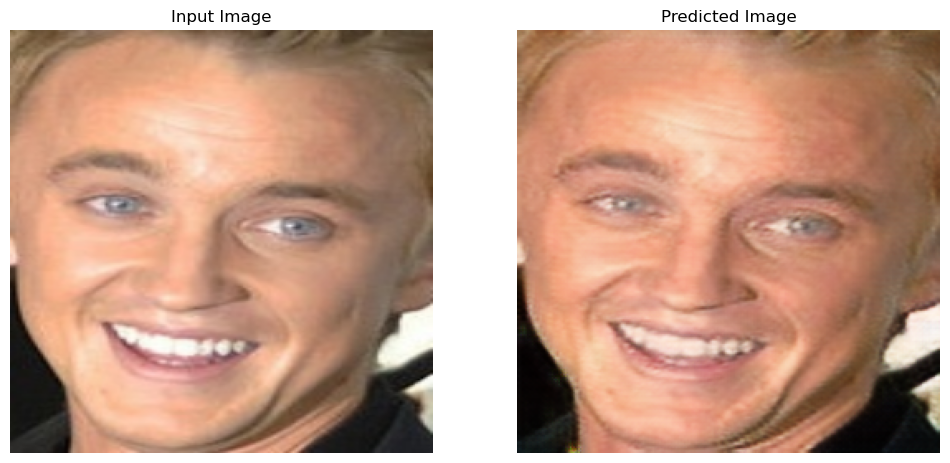

In [ ]:
content_image = get_image('277011_1987-09-22_2011.jpg',resize=True)
content_image = content_image[np.newaxis,...]
generate_images(SAVE_PATH_GENERATOR_OLD,content_image)

# 4. Classification

### Data Loading

In [ ]:
celeb_young_tsv = os.path.join(celeb_path, 'celeb_tsv_young')
celeb_old_tsv = os.path.join(celeb_path,'celeb_tsv_old')

Celeb_young_dataset = ClassificationDataset(celeb_young_tsv,os.path.join(celeb_path, 'Young'))
Celeb_old_dataset = ClassificationDataset(celeb_old_tsv, os.path.join(celeb_path, 'Old'))

print("Celeb training size:", Celeb_young_dataset.__len__())
display(Celeb_young_dataset.data)

Celeb_young_dataset.data.groupby(['classification_label']).count()


Celeb training size: 536


,file_name,classification_label,Status,file_path
0,Andy Lau_Young_1.jpg,Andy Lau,Young,Dataset/Celebrities/Young/Andy Lau/Andy Lau_Yo...
1,Andy Lau_Young_10.jpg,Andy Lau,Young,Dataset/Celebrities/Young/Andy Lau/Andy Lau_Yo...
2,Andy Lau_Young_11.jpg,Andy Lau,Young,Dataset/Celebrities/Young/Andy Lau/Andy Lau_Yo...
3,Andy Lau_Young_12.jpg,Andy Lau,Young,Dataset/Celebrities/Young/Andy Lau/Andy Lau_Yo...
4,Andy Lau_Young_13.jpg,Andy Lau,Young,Dataset/Celebrities/Young/Andy Lau/Andy Lau_Yo...
...,...,...,...,...
531,Vivian Chow_Young_52.jpg,Vivian Chow,Young,Dataset/Celebrities/Young/Vivian Chow/Vivian C...
532,Vivian Chow_Young_6.jpg,Vivian Chow,Young,Dataset/Celebrities/Young/Vivian Chow/Vivian C...
533,Vivian Chow_Young_7.jpg,Vivian Chow,Young,Dataset/Celebrities/Young/Vivian Chow/Vivian C...
534,Vivian Chow_Young_8.jpg,Vivian Chow,Young,Dataset/Celebrities/Young/Vivian Chow/Vivian C...


,file_name,Status,file_path
classification_label,,,
Andy Lau,61,61,61
Carmen Lee,60,60,60
Carrie Fisher,51,51,51
Harrison Ford,50,50,50
Jacky Cheung,58,58,58
Kate Winslet,52,52,52
Laura Dern,50,50,50
Stephen Chow,50,50,50
Tom Cruise,52,52,52


##3.2 Data Display

### Display Raw Batch

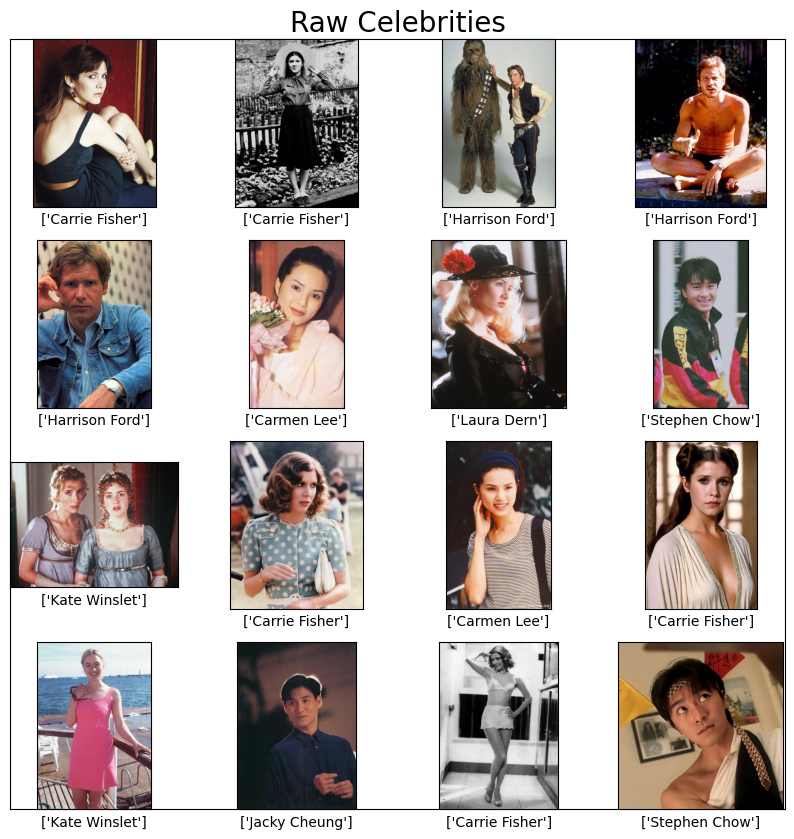

In [ ]:
Celeb_young_dataset.reset_pointer()
display_batch,display_batch_labels = Celeb_young_dataset.get_batch(resize=False,normalize=False)

batch_display(display_batch, Celeb_young_dataset.batch_size, display_batch_labels, Celeb_young_dataset.labelnames, title='Raw Celebrities')

### Display Cropped Batch

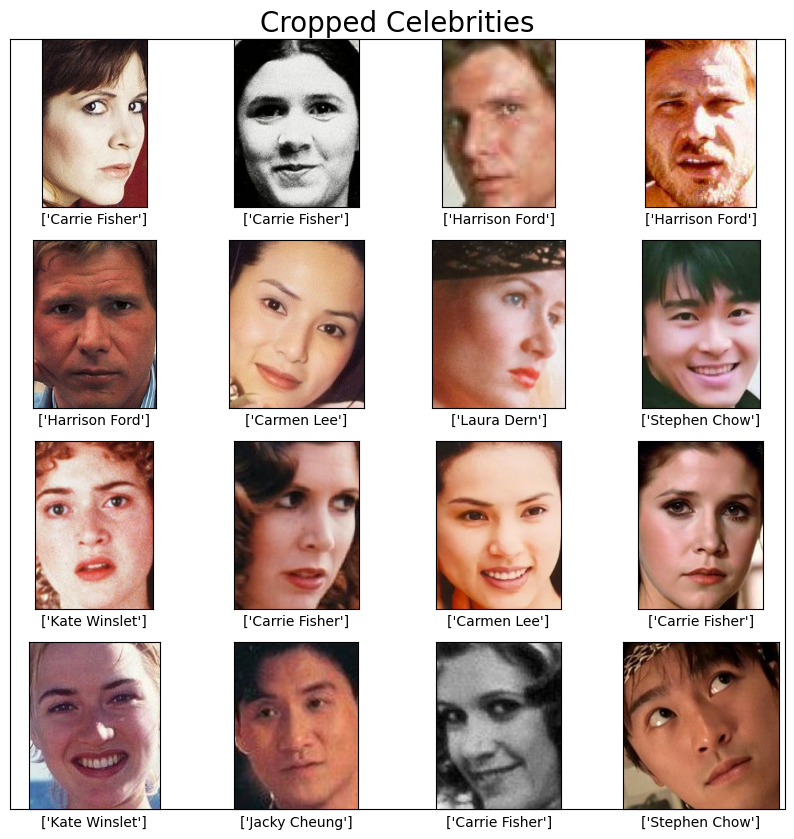

In [ ]:
cropped_batch = crop_face(display_batch,16)
batch_display(cropped_batch, Celeb_young_dataset.batch_size, display_batch_labels, Celeb_young_dataset.labelnames, title='Cropped Celebrities')


## 3.3 Aged/Young Images Generation

In [ ]:
def generate_fake(model_path, image_load_path, save_path, mode, name):

    if mode == 'old2young':

        model = load_model(model_path,custom_objects={'ReflectionPadding2D': ReflectionPadding2D})
        old_img = get_image(image_load_path,resize=True)
        old_img = old_img[np.newaxis,...]

        normalized_old = normalize_image(old_img)

        prediction_to_young = model.predict(normalized_old)
        prediction_to_young = (prediction_to_young*0.5+0.5)*255
        prediction_to_young = array_to_img(prediction_to_young[0])

        os.chdir(save_path)
        prediction_to_young.save(name)


    elif mode == 'young2old':

        model = load_model(model_path,custom_objects={'ReflectionPadding2D': ReflectionPadding2D})
        young_img = get_image(image_load_path,resize=True)
        young_img = young_img[np.newaxis,...]

        normalized_young = normalize_image(young_img)

        prediction_to_old = model.predict(normalized_young)
        prediction_to_old = (prediction_to_old*0.5+0.5)*255
        prediction_to_old = array_to_img(prediction_to_old[0])

        os.chdir(save_path)
        prediction_to_old.save(name)

    root = '/mnt/c/Project'
    os.chdir(root)



### Create Empty Directory

In [ ]:
states = ['Old', 'Young']
fake_path = os.path.join(data_path, 'Celebrities Fake')
fake_states = ['Old to Young', 'Young to old']


for state,fake_states in zip(states,fake_states):

    state_path = os.path.join(celeb_path, state)
    state_fake_path = os.path.join(fake_path, fake_states)

    for label in os.listdir(state_path):
        ds_dir = os.path.join(state_path, label)
        os.chdir(state_fake_path)
        # os.mkdir(label)

        root = '/mnt/c/Project'
        os.chdir(root)

### Save generated images

In [ ]:
GENERATOR_OLD_PATH = "Saved/old_generator_9_50 epochs.keras"
GENERATOR_YOUNG_PATH = "Saved/young_generator_9_50 epochs.keras"

In [ ]:
root = '/mnt/c/Project'
os.chdir(root)

In [ ]:
states = ['Old', 'Young']

fake_path = os.path.join(data_path, 'Celebrities Fake')

for state in states:

    state_cropped_path = os.path.join(celeb_path, state + " Cropped")

    if state == 'Old':
        tar = os.path.join(fake_path,'Old to Young')
        model_path = GENERATOR_YOUNG_PATH
        mode = 'old2young'

    elif state == 'Young':
        tar = os.path.join(fake_path,'Young to Old')
        model_path = GENERATOR_OLD_PATH
        mode = 'young2old'


    for label in os.listdir(state_cropped_path):
        label_path = os.path.join(state_cropped_path,label)

        for img in os.listdir(label_path):
            image_path = os.path.join(label_path,img)
            target_path = os.path.join(tar,label)

            # generate_fake(model_path, image_path, target_path, mode, img)




### Create tsvs

In [ ]:
for state in os.listdir(celeb_path):
    celeb_tsv = ""
    name = 'celeb_tsv' + "_" + state.lower()
    label_path = os.path.join(celeb_path, state)
    # print(label)
    for label in os.listdir(label_path):
        # print(f"Content of '{folder}'")
        path = os.path.join(label_path,label)

        for img in os.listdir(path):
            entry = img + "\t"+ label + "\t" + state + "\n"
            celeb_tsv += entry
            print(img)

    with open(name, "w") as f:
        # f.write(celeb_tsv)

In [ ]:
for state in os.listdir(fake_path):
    celeb_tsv = ""
    name = 'celeb_tsv' + "_" + state.lower()
    label_path = os.path.join(fake_path, state)
    # print(label)
    for label in os.listdir(label_path):
        # print(f"Content of '{folder}'")
        path = os.path.join(label_path,label)

        for img in os.listdir(path):
            entry = img + "\t"+ label + "\t" + state + "\n"
            celeb_tsv += entry
            print(img)

    with open(name, "w") as f:
        # f.write(celeb_tsv)


## 3.4 Prepare Datasets  


In [ ]:
def prepare_datasets(train,train_tsv,test, test_tsv):
    #####
    # MODIFY SETTINGS HERE
    #####
    BATCH_SIZE = 64
    TRAIN_DS_PATH = os.path.join(fake_path, train)
    TRAIN_TSV_PATH = os.path.join(fake_path, train_tsv)
    TEST_DS_PATH = os.path.join(celeb_path, test)
    TEST_TSV_PATH = os.path.join(celeb_path, test_tsv)

    train_ds = ClassificationDataset(TRAIN_TSV_PATH, TRAIN_DS_PATH, batch_size = BATCH_SIZE)
    test_ds = ClassificationDataset(TEST_TSV_PATH, TEST_DS_PATH, batch_size = BATCH_SIZE)

    return train_ds, test_ds



## 3.5 Build The Model

In [ ]:
from tensorflow.keras.applications import VGG19

def build_classifier(input_shape, num_class):

    pre_train = VGG19(input_shape=(256,256,3), include_top=False, weights="imagenet")

    for layer in pre_train.layers:
        layer.trainable = False   # freezing the layers
    pre_train.summary()

    vgg_model = Sequential()
    vgg_model.add(pre_train)
    vgg_model.add(MaxPooling2D((2,2), strides = 2))

    vgg_model.add(Flatten())

    # vgg_model.add(Dense(units = 2048, activation = 'relu'))
    # vgg_model.add(Dense(units = 1024, activation = 'relu'))
    # vgg_model.add(Dense(units = 1024, activation = 'relu'))
    # vgg_model.add(Dense(units = 512, activation = 'relu'))
    vgg_model.add(Dense(units = 512, activation = 'relu'))
    vgg_model.add(Dropout(0.5))

    vgg_model.add(Dense(units = num_class, activation = 'softmax'))

    return vgg_model

In [ ]:
def classifier_setup(LOAD_PATH = None):

    INPUT_SHAPE = (None, None, 3)

    # Build model
    NUMCLASSES = 10
    model = build_classifier(INPUT_SHAPE,NUMCLASSES)

    # Get Loss
    loss_fn = tf.keras.losses.CategoricalCrossentropy()

    if LOAD_PATH:
        model.load_weights(LOAD_PATH)

    return model, loss_fn

classifier, classifier_loss = classifier_setup()

In [ ]:
classifier.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 8, 8, 512)         20024384  
                                                                 
 max_pooling2d (MaxPooling2  (None, 4, 4, 512)         0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 512)               4194816   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 10)                5130      
                                                        

## 3.6 Training Routine

In [ ]:
def classifier_train(model, dataset, loss_fn, n_epochs = 100, save_interval = 10, save_path=None, load_path=None):
    # Initialize the Optimizer
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, weight_decay=5e-5) # [Your code here]

    # Calculate the number of batches per epoch
    n_batches = dataset.__len__() // dataset.batch_size

    # Initialize other things
    process = psutil.Process(os.getpid())

    # Load weights if provided
    if load_path:
        model.load_weights(load_path)

    # Run for n epochs
    for e in range(1, n_epochs+1):
        pbar = tqdm(total=n_batches)
        # Reset Dataset Iterators
        # [Your code here]
        dataset.reset_pointer()

        # Define Loss Metrics. To be updated in each batch
        losses = {"cross-entropy": 0.0}

        # Run for all batches
        for i in range(n_batches):
            # Fetch Training Batches
            # [Your code here]
            batch_images, batch_labels = dataset.get_batch(resize=True,normalize=True)
            batch_images = np.asarray(batch_images).astype('float32')
            # batch images = random_flip(batch_image, dataset.batch_size, 1)


            # Execute Batch Training
            # [Your code here]
            with tf.GradientTape() as tape:
                predictions = model(batch_images)
                loss = loss_fn(batch_labels, predictions)

            gradients = tape.gradient(loss, model.trainable_variables)
            optimizer.apply_gradients(zip(gradients, model.trainable_variables))

            # Update Loss Metrics
            # [Your code here]
            losses["cross-entropy"] += loss.numpy()

            # Visualize loss during training
            string = "".join([f"{key} loss: {value / (i + 1):.3f}\t" for key, value in losses.items()])
            pbar.set_description(f"Epoch {e}/{n_epochs}\t" + string)
            pbar.update(1)

        # In case the session ends before the training is done, perform save the model from time to time:
        if e % save_interval == 0:
            if save_path:
                model.save(save_path)


## 3.7 Training

### Visualize Data

In [ ]:
fake_old_train_ds, real_old_test_ds = prepare_datasets('Young to Old','celeb_tsv_young to old','Old Cropped','celeb_tsv_old cropped')

display(fake_old_train_ds.data.groupby(['classification_label']).count())


,file_name,Status,file_path
classification_label,,,
Andy Lau,59,59,59
Carmen Lee,60,60,60
Carrie Fisher,50,50,50
Harrison Ford,50,50,50
Jacky Cheung,56,56,56
Kate Winslet,51,51,51
Laura Dern,49,49,49
Stephen Chow,49,49,49
Tom Cruise,50,50,50


In [ ]:
display(real_old_test_ds.data.groupby(['classification_label']).count())

,file_name,Status,file_path
classification_label,,,
Andy Lau,55,55,55
Carmen Lee,50,50,50
Carrie Fisher,49,49,49
Harrison Ford,50,50,50
Jacky Cheung,51,51,51
Kate Winslet,50,50,50
Laura Dern,61,61,61
Stephen Chow,44,44,44
Tom Cruise,51,51,51


### Fake Old & Real Old

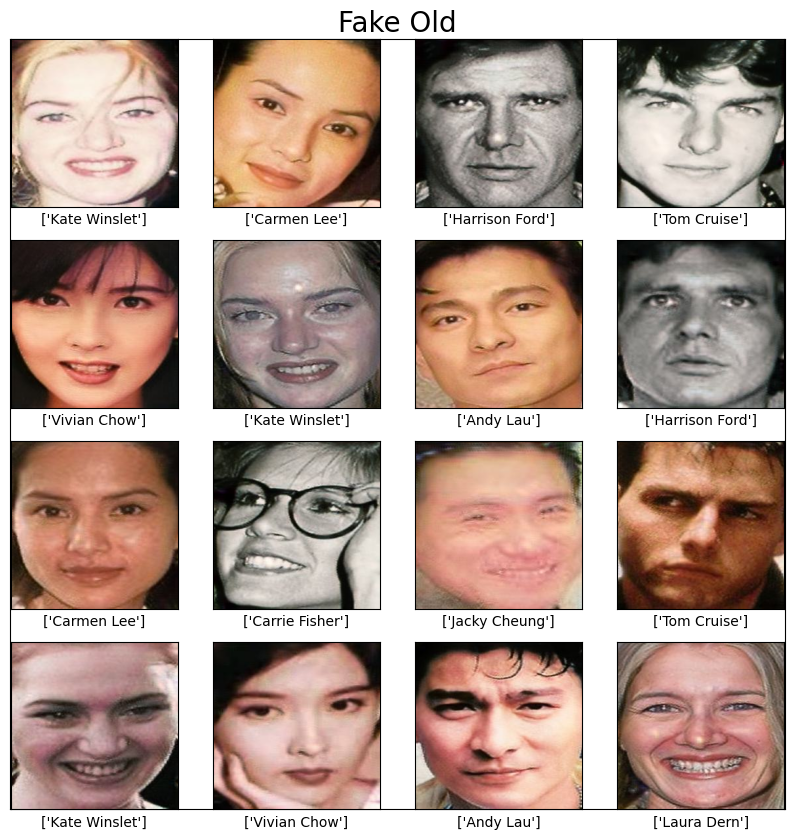

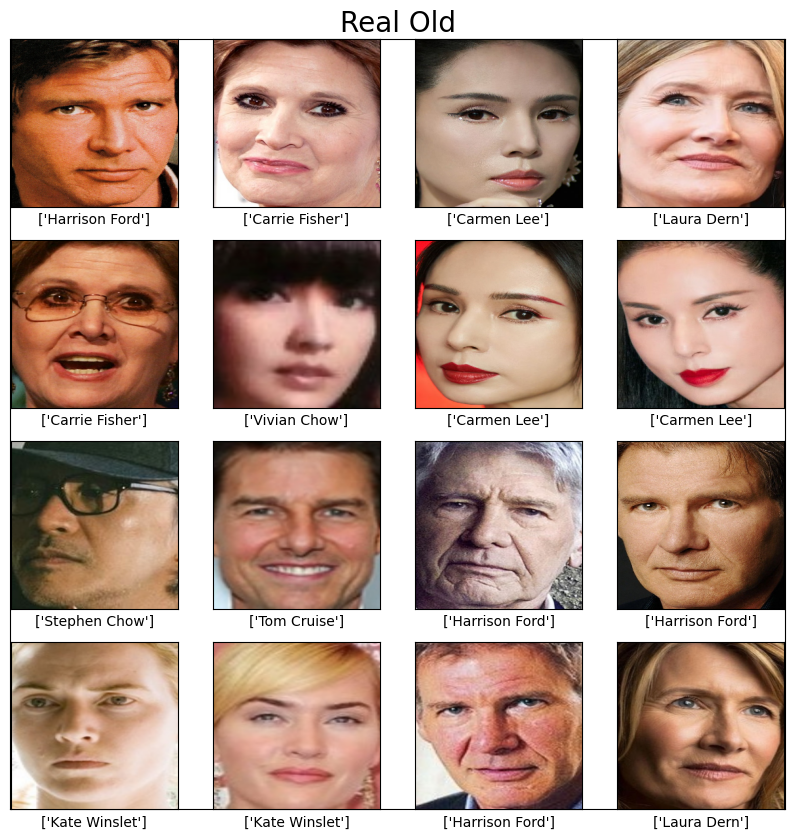

In [ ]:
fake_old_train_ds.reset_pointer()
real_old_test_ds.reset_pointer()

train_display_batch_fake_old,train_display_batch_labels = fake_old_train_ds.get_batch(resize=False,normalize=False)
test_display_batch_real_old,test_display_labels = real_old_test_ds.get_batch(resize=True,normalize=False)

batch_display(train_display_batch_fake_old, 16, train_display_batch_labels, fake_old_train_ds.labelnames,title='Fake Old')
batch_display(test_display_batch_real_old, 16, test_display_labels, real_old_test_ds.labelnames,title='Real Old')

### Fake Young and Real Young

In [ ]:
fake_path = os.path.join(data_path, 'Celebrities Fake')

In [ ]:
fake_young_train_ds, real_young_test_ds = prepare_datasets('Old to Young','celeb_tsv_old to young','Young Cropped','celeb_tsv_young cropped')

In [ ]:
display(fake_young_train_ds.data.groupby(['classification_label']).count())

,file_name,Status,file_path
classification_label,,,
Andy Lau,55,55,55
Carmen Lee,50,50,50
Carrie Fisher,49,49,49
Harrison Ford,50,50,50
Jacky Cheung,51,51,51
Kate Winslet,50,50,50
Laura Dern,61,61,61
Stephen Chow,44,44,44
Tom Cruise,51,51,51


In [ ]:
display(real_young_test_ds.data.groupby(['classification_label']).count())

,file_name,Status,file_path
classification_label,,,
Andy Lau,59,59,59
Carmen Lee,60,60,60
Carrie Fisher,50,50,50
Harrison Ford,50,50,50
Jacky Cheung,56,56,56
Kate Winslet,51,51,51
Laura Dern,49,49,49
Stephen Chow,49,49,49
Tom Cruise,50,50,50


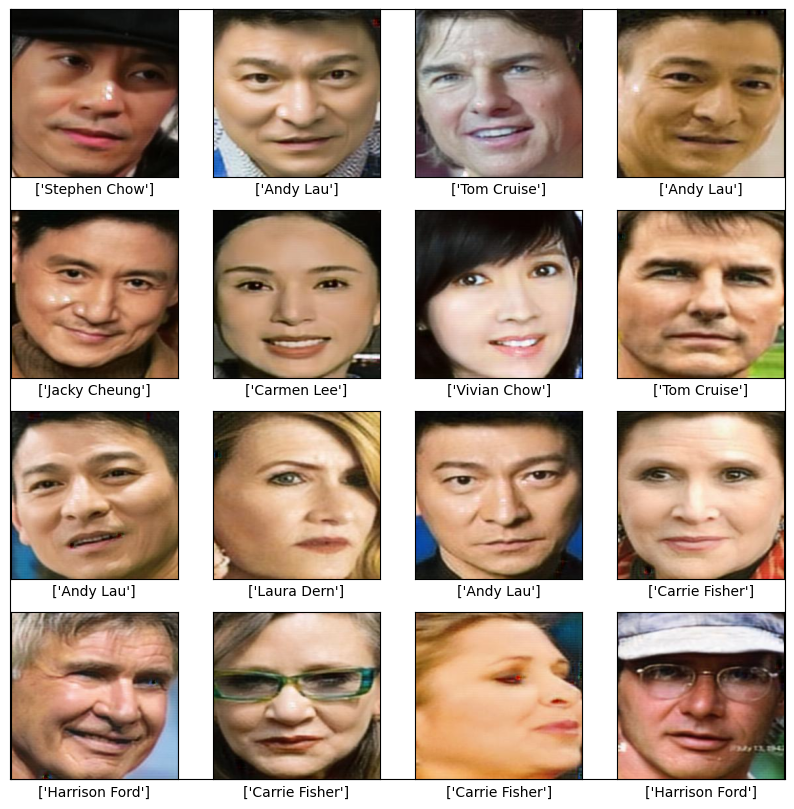

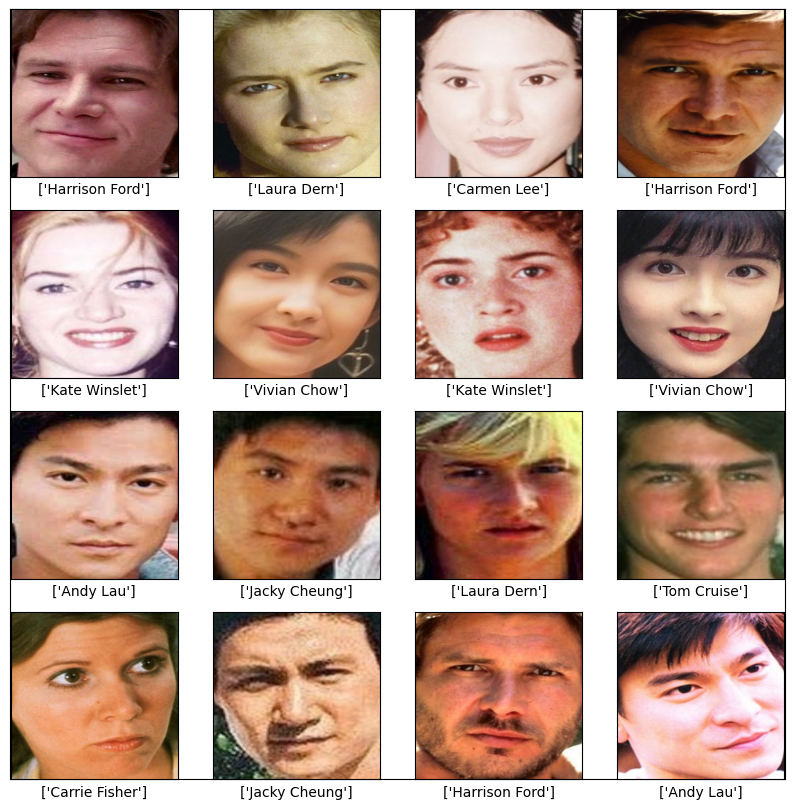

In [ ]:
fake_young_train_ds.reset_pointer()
real_young_test_ds.reset_pointer()

train_display_batch_fake_young,train_display_batch_labels = fake_young_train_ds.get_batch(resize=False,normalize=False)
test_display_batch_real_young,test_display_labels = real_young_test_ds.get_batch(resize=True,normalize=False)

batch_display(train_display_batch_fake_young, 16, train_display_batch_labels, fake_young_train_ds.labelnames,'Fake Young')
batch_display(test_display_batch_real_young, 16, test_display_labels, real_young_test_ds.labelnames,'Real Young')

### Fake Old as Training Set

In [ ]:
# Train the model
CLASSIFIER_SAVE_PATH_1 = "Saved/classify.keras" # [Change to your own path]

# [Call your train function here]
classifier_train(classifier, fake_old_train_ds, classifier_loss, n_epochs=20, save_path=CLASSIFIER_SAVE_PATH_1)

  0%|          | 0/8 [00:00<?, ?it/s]

2024-05-06 19:41:47.294734: I external/local_xla/xla/service/service.cc:168] XLA service 0x34457bf0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-06 19:41:47.294767: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-05-06 19:41:47.298006: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1714995707.361595    8596 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


KeyboardInterrupt: 

### Fake Young as Training Set

In [ ]:
# Train the model
CLASSIFIER_SAVE_PATH_2 = "Saved/classify_young.keras" # [Change to your own path]

# [Call your train function here]
classifier_train(classifier, fake_young_train_ds, classifier_loss, n_epochs=10, save_path=CLASSIFIER_SAVE_PATH_2)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

### Real Young as Training Set

In [ ]:
# Train the model
CLASSIFIER_SAVE_PATH_3 = "Saved/classify_realoldyoung.keras" # [Change to your own path]

# [Call your train function here]
classifier_train(classifier, real_young_test_ds, classifier_loss, n_epochs=10, save_path=CLASSIFIER_SAVE_PATH_3)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

### Real Old as Training Set

In [ ]:
# Train the model
CLASSIFIER_SAVE_PATH_4 = "Saved/classify_realyoungold.keras" # [Change to your own path]

# [Call your train function here]
classifier_train(classifier, real_old_test_ds, classifier_loss, n_epochs=10, save_path=CLASSIFIER_SAVE_PATH_4)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

## 3.8 Results Evaluation

In [ ]:
def evaluate(model_path, dataset):
    # [Your code here]
    model = load_model(model_path)
    dataset.reset_pointer()
    n_batches = dataset.__len__() // dataset.batch_size

    predlist = []
    actuallist = []

    for i in range(n_batches):
        batch_img, batch_labels = dataset.get_batch()
        batch_img = np.asarray(batch_img).astype('float32')

        predicted = model.predict(batch_img)
        predicted = tf.argmax(predicted,axis=1)
        actual = tf.argmax(batch_labels,axis=1)

        predlist = np.concatenate((predlist,predicted))
        actuallist = np.concatenate((actuallist,actual))

    accuracy = (np.sum(predlist == actuallist)) / dataset.__len__()
    print("Accuracy:",accuracy)

    onehotencodededed = dataset.encoder.fit_transform(dataset.data[['classification_label']])

    labelnames = dataset.encoder.get_feature_names_out(['classification_label'])

    for i,label in zip(range(len(labelnames)),labelnames):
        labelnames[i] = label.replace("classification_label_",'')


    cm = confusion_matrix(y_true=actuallist, y_pred=predlist)

    thresh = cm.max()/2
    for i, j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j], horizontalalignment='center',color = 'white' if cm[i,j] > thresh else 'black')

    plt.imshow(cm, cmap='Oranges')
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(labelnames))
    plt.xticks(tick_marks,labelnames,rotation = 90)
    plt.yticks(tick_marks,labelnames)

    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")



### **Training:** Fake old vs **Testing:** Real old

2/2 [==============================] - 0s 36ms/step
0.62109375


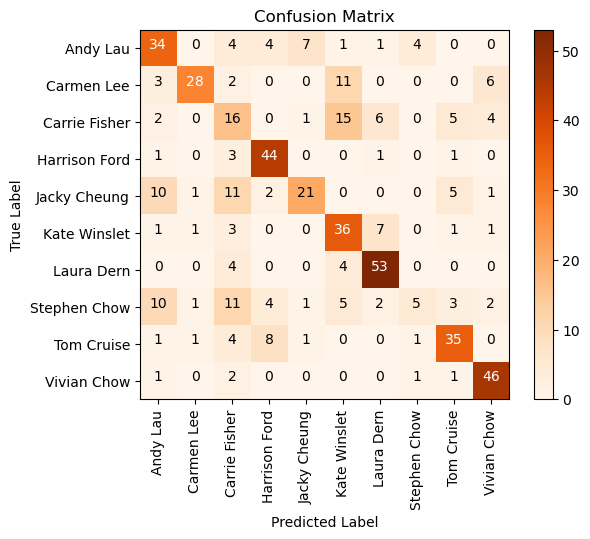

In [ ]:
evaluate("Saved/classify.keras",real_old_test_ds)

### **Training:** Real Young vs **Testing**: Real old

2/2 [==============================] - 0s 45ms/step
0.994140625


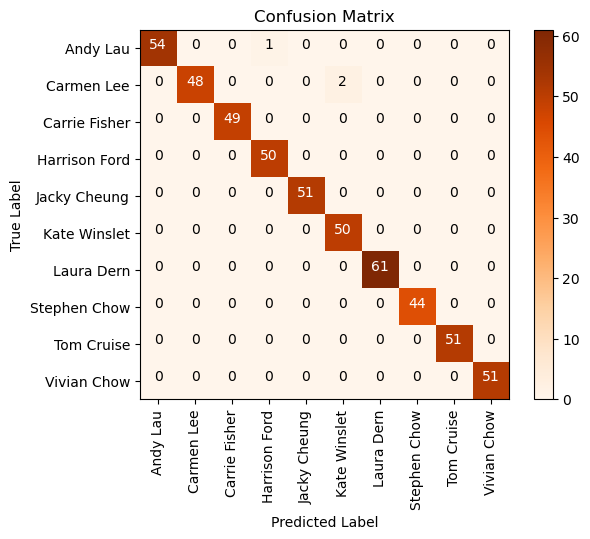

In [ ]:
evaluate("Saved/classify_realoldyoung.keras",real_old_test_ds)

### **Training:** Fake Young vs **Testing**: Real Young

2/2 [==============================] - 0s 50ms/step
0.5028571428571429


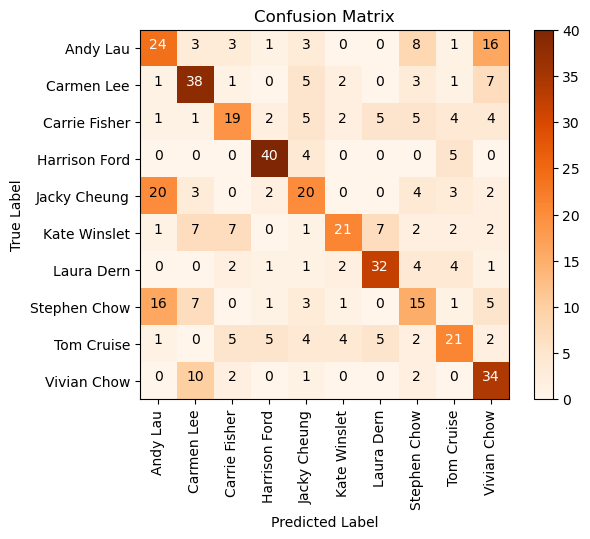

In [ ]:
evaluate("Saved/classify_young.keras",real_young_test_ds)

### **Training:** Real Old vs **Testing:** Real Young

2/2 [==============================] - 0s 51ms/step
0.8971428571428571


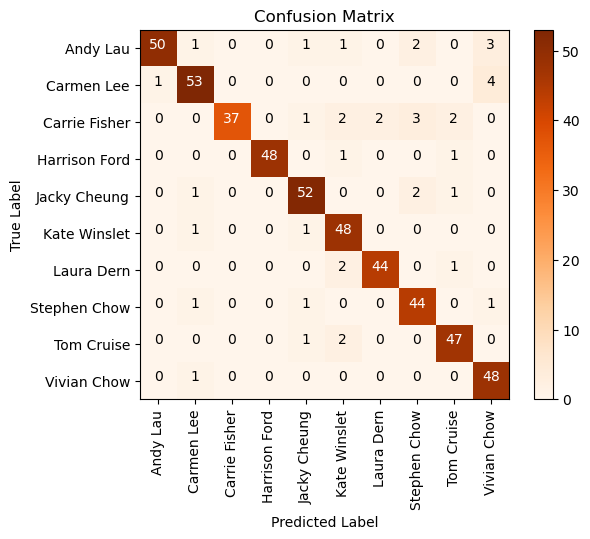

In [ ]:
evaluate("Saved/classify_realyoungold.keras",real_young_test_ds)